In [1]:
!nvidia-smi

Sun Jul 23 17:30:12 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 536.40                 Driver Version: 536.40       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4080      WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   38C    P8              18W / 340W |    733MiB / 16376MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Jun_13_19:42:34_Pacific_Daylight_Time_2023
Cuda compilation tools, release 12.2, V12.2.91
Build cuda_12.2.r12.2/compiler.32965470_0


In [2]:
import torch
import torchvision

torch.cuda.is_available()

True

In [12]:
import os

In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [3]:
from d2go.model_zoo import model_zoo
model = model_zoo.get('faster_rcnn_fbnetv3a_C4.yaml', trained=True)

[2023-07-23 18:01:16,954] torch.distributed.elastic.multiprocessing.redirects: [WARNING] NOTE: Redirects are currently not supported in Windows or MacOs.
INFO:d2go.modeling.backbone.fbnet_v2:Using un-unified arch_def for ARCH "FBNetV3_A" (without scaling):
trunk
- [('conv_k3', 16, 2, 1), ('ir_k3', 16, 1, 2, {'expansion': 1}, {'less_se_channels': False})]
- [('ir_k5', 24, 2, 1, {'expansion': 4}, {'less_se_channels': False}), ('ir_k5', 24, 1, 3, {'expansion': 3}, {'less_se_channels': False})]
- [('ir_k5_se', 32, 2, 1, {'expansion': 4}, {'less_se_channels': False}), ('ir_k3_se', 32, 1, 3, {'expansion': 3}, {'less_se_channels': False})]
- [('ir_k5', 64, 2, 1, {'expansion': 4}, {'less_se_channels': False}), ('ir_k3', 64, 1, 3, {'expansion': 3}, {'less_se_channels': False}), ('ir_k5_se', 112, 1, 1, {'expansion': 4}, {'less_se_channels': False}), ('ir_k5_se', 112, 1, 5, {'expansion': 3}, {'less_se_channels': False})]
rpn
- [('ir_k5_se', 112, 1, 5, {'expansion': 3}, {'less_se_channels': False}

[07/23 18:01:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://mobile-cv.s3-us-west-2.amazonaws.com/d2go/models/268421013/model_final.pth ...


INFO:iopath.common.file_io:URL https://mobile-cv.s3-us-west-2.amazonaws.com/d2go/models/268421013/model_final.pth cached in C:\Users\patha/.torch/iopath_cache\d2go/models/268421013\model_final.pth
INFO:fvcore.common.checkpoint:[Checkpointer] Loading from C:\Users\patha/.torch/iopath_cache\d2go/models/268421013\model_final.pth ...
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pw.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pw.bn.{bias, num_batches_tracked, running_mean, running_var, weight}
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.dw.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pwl.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pwl.bn.{bias, num_batches_tracked, running_mean, running_var, weight}
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_1.pw.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_1.pw.bn.{bias, num_batches_tracked, running_mean, running_var, weight}
  roi_heads.mask_head

In [4]:
!pip install opencv-python wget

  Using cached wget-3.2-py3-none-any.whl


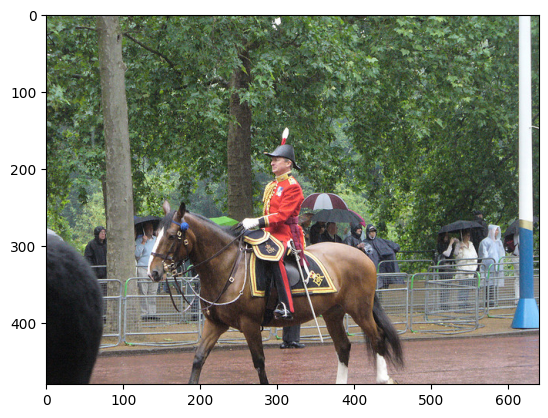

In [5]:
import cv2
import wget
from matplotlib import pyplot as plt
test_img = wget.download('http://images.cocodataset.org/val2017/000000439715.jpg')
im = cv2.imread(test_img)
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))

In [6]:
from d2go.utils.demo_predictor import DemoPredictor
predictor = DemoPredictor(model)
outputs = predictor(im)
# the output object categories and corresponding bounding boxes
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([17,  0,  0, 17, 17, 17,  0, 20, 19,  0, 17, 20, 17, 22, 19, 19, 19],
       device='cuda:0')
Boxes(tensor([[123.8079, 241.3668, 479.7077, 480.0000],
        [276.2698, 147.8134, 365.5552, 400.5736],
        [ 51.7616, 279.1452,  78.7410, 341.4582],
        [504.6449, 261.5896, 587.4643, 335.0935],
        [331.7757, 234.2151, 410.3200, 307.9569],
        [408.7352, 285.3529, 462.2007, 353.3489],
        [  2.9695, 277.4146,  75.1752, 476.9488],
        [  3.1916, 277.9533,  75.0519, 476.4228],
        [504.8620, 262.9458, 592.4183, 338.9946],
        [556.2560, 270.3599, 595.2364, 355.6505],
        [  3.2832, 277.9501,  75.0456, 476.7798],
        [504.8283, 262.8472, 587.5283, 330.2950],
        [555.7513, 280.5811, 595.2999, 360.6214],
        [555.3557, 279.8431, 595.3768, 360.5025],
        [595.2872, 266.1652, 628.4623, 333.6741],
        [  2.7071, 277.7719,  75.3947, 476.8104],
        [555.5415, 276.6591, 598.2333, 355.9480]], device='cuda:0'))


C:\Users\patha\anaconda3\envs\d2go\lib\site-packages\torch\functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3492.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


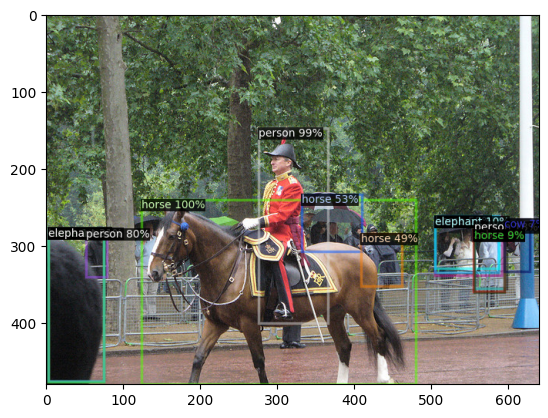

In [7]:
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get("coco_2017_train"))
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.imshow(cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## Train on a custom dataset
In this section, we show how to train a d2go model on a custom dataset.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in d2go's [model zoo](https://github.com/facebookresearch/d2go/blob/master/MODEL_ZOO.md).

### Prepare the dataset

In [13]:
import shutil
import subprocess
from zipfile import ZipFile

dataset_dir = (os.getcwd() + '/dataset').replace('\\','/')
old_balloon_dataset = (os.getcwd() + '/balloon_dataset.zip').replace('\\','/')

if os.path.exists(dataset_dir):
    shutil.rmtree(dataset_dir, ignore_errors=True)
    print('found old dataset, removed')

if os.path.exists(old_balloon_dataset):
    os.remove(old_balloon_dataset)
    print('found zip file, removed')
    
print(dataset_dir)
os.makedirs(dataset_dir, exist_ok=True)

found old dataset, removed
C:/Users/patha/projects/d2go/dataset


In [14]:
# download, decompress the data
balloon_dataset = wget.download('https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip')

with ZipFile(balloon_dataset, 'r') as f:
    f.extractall(dataset_dir)

In [15]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")
import os
import json
import numpy as np
from detectron2.structures import BoxMode

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("dataset/balloon/" + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"], evaluator_type="coco")
balloon_metadata = MetadataCatalog.get("balloon_train")

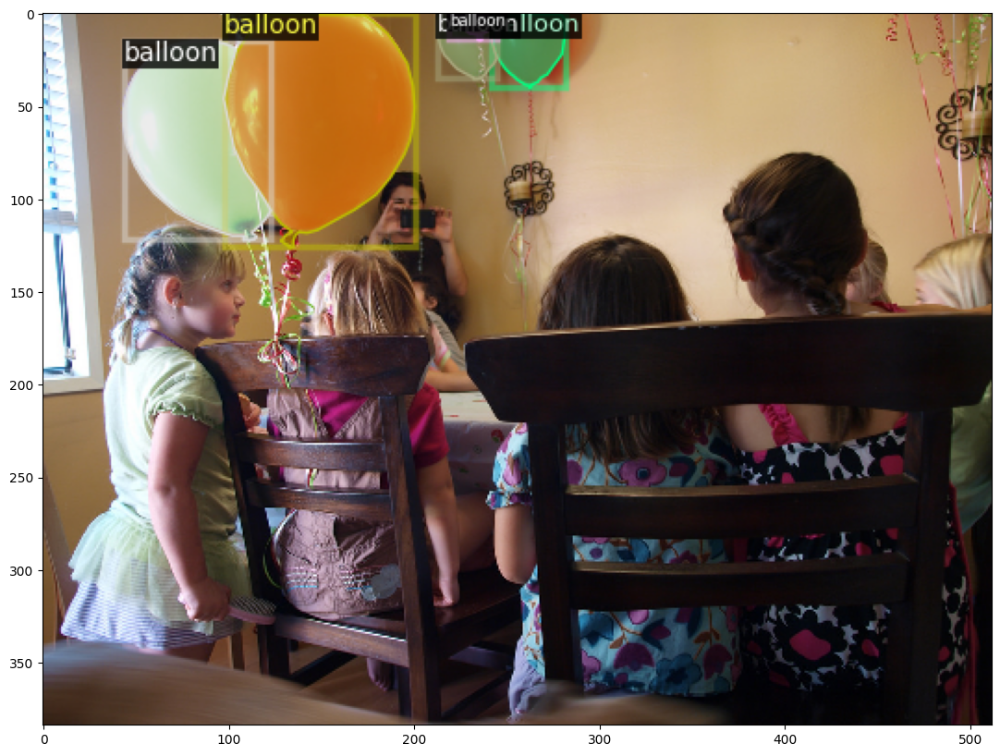

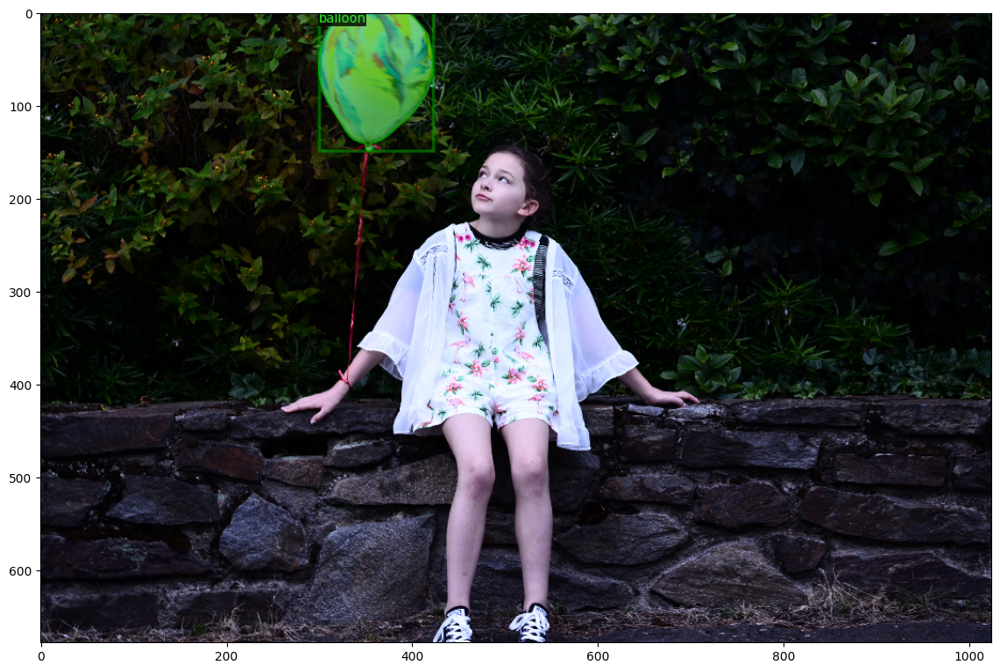

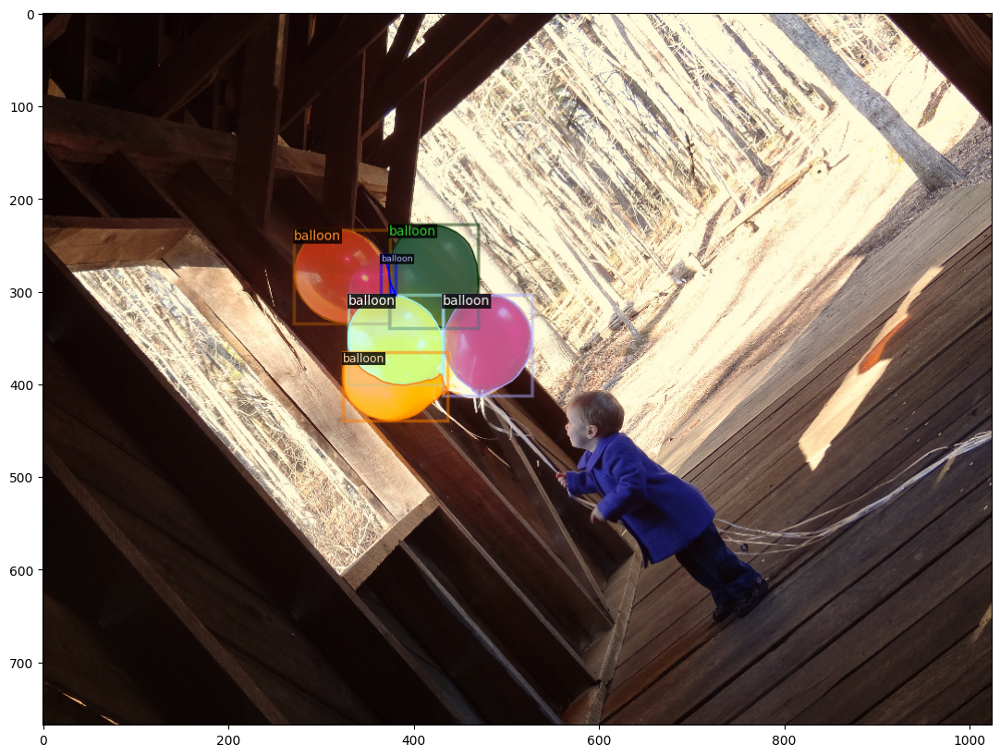

In [16]:
import random

dataset_dicts = DatasetCatalog.get('balloon_train')
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [17]:
for d in ["train", "val"]:
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"], evaluator_type="coco")

In [18]:
from d2go.runner import GeneralizedRCNNRunner


def prepare_for_launch():
    runner = GeneralizedRCNNRunner()
    cfg = runner.get_default_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("faster_rcnn_fbnetv3a_C4.yaml"))
    cfg.MODEL_EMA.ENABLED = False
    cfg.DATASETS.TRAIN = ("balloon_train",)
    cfg.DATASETS.TEST = ("balloon_val",)
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("faster_rcnn_fbnetv3a_C4.yaml")  # Let training initialize from model zoo
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
    cfg.SOLVER.MAX_ITER = 600    # 600 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
    cfg.SOLVER.STEPS = []        # do not decay learning rate
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
    # NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    return cfg, runner

cfg, runner = prepare_for_launch()
model = runner.build_model(cfg)
runner.do_train(cfg, model, resume=False)

INFO:d2go.modeling.backbone.fbnet_v2:Build FBNet using unified arch_def:
trunk
- {'block_op': 'conv_k3', 'block_cfg': {'out_channels': 16, 'stride': 2}, 'stage_idx': 0, 'block_idx': 0}
- {'block_op': 'ir_k3', 'block_cfg': {'out_channels': 16, 'stride': 1, 'expansion': 1, 'less_se_channels': False}, 'stage_idx': 0, 'block_idx': 1}
- {'block_op': 'ir_k3', 'block_cfg': {'out_channels': 16, 'stride': 1, 'expansion': 1, 'less_se_channels': False}, 'stage_idx': 0, 'block_idx': 2}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 2, 'expansion': 4, 'less_se_channels': False}, 'stage_idx': 1, 'block_idx': 0}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 1, 'expansion': 3, 'less_se_channels': False}, 'stage_idx': 1, 'block_idx': 1}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 1, 'expansion': 3, 'less_se_channels': False}, 'stage_idx': 1, 'block_idx': 2}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 1, 'expansio

INFO:d2go.optimizer.build:optimizer parameter groups:
Param group 0: {dampening: 0, differentiable: False, foreach: True, lr: 0.00025, maximize: False, momentum: 0.9, nesterov: False, params: 185, weight_decay: 0.0001}
Param group 1: {dampening: 0, differentiable: False, foreach: True, lr: 0.00025, maximize: False, momentum: 0.9, nesterov: False, params: 122, weight_decay: 0.0}

INFO:d2go.optimizer.build:Write parameter groups to file: ./output\param_groups.txt
INFO:d2go.checkpoint.log_checkpoint:Checkpoint:530157619 load begin 


[07/23 18:05:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://mobile-cv.s3-us-west-2.amazonaws.com/d2go/models/268421013/model_final.pth ...


INFO:fvcore.common.checkpoint:[Checkpointer] Loading from C:\Users\patha/.torch/iopath_cache\d2go/models/268421013\model_final.pth ...
INFO:mobile_cv.torch.utils_pytorch.distributed_helper:[interleave_by_rank] rank0/1 starts
INFO:mobile_cv.torch.utils_pytorch.distributed_helper:[interleave_by_rank] rank0/1 ends
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pw.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pw.bn.{bias, num_batches_tracked, running_mean, running_var, weight}
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.dw.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pwl.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_0.pwl.bn.{bias, num_batches_tracked, running_mean, running_var, weight}
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_1.pw.conv.weight
  roi_heads.mask_head.feature_extractor.0.fbnetv2_0_1.pw.bn.{bias

[07/23 18:05:18 d2.data.build]: Removed 0 images with no usable annotations. 61 images left.
[07/23 18:05:18 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 255          |
|            |              |
[07/23 18:05:18 d2.data.build]: Using training sampler TrainingSampler
[07/23 18:05:18 d2.data.common]: Serializing the dataset using: <class 'mobile_cv.torch.utils_pytorch.shareables.SharedList'>


INFO:mobile_cv.torch.utils_pytorch.shareables:Serializing 61 elements to byte tensors and concatenating them all ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Serialized dataset takes 0.17 MiB
INFO:mobile_cv.torch.utils_pytorch.shareables:Moving serialized dataset to shared memory ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Moving data to shared memory (SharedMemory('wnsm_dee09bdb', size=177024)) ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Moving data to shared memory (SharedMemory('wnsm_be902e8d', size=488)) ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Finished moving to shared memory
INFO:d2go.runner.training_hooks:Update trainer hooks from add_memory_profiler_hook...


[07/23 18:05:18 d2.engine.train_loop]: Starting training from iteration 0


INFO:d2go.utils.flop_calculator:Evaluating model's number of parameters and FLOPS
INFO:d2go.utils.flop_calculator:Flops info written to ./output\flops_str_mobilecv.txt
INFO:d2go.utils.flop_calculator:Flops info written to ./output\flops_str_fvcore.txt
INFO:d2go.utils.flop_calculator:Flops table (full version) written to ./output\flops_table_fvcore.txt
INFO:d2go.utils.flop_calculator:Flops table:
| module                                                   | #parameters or shape   | #flops     |
|:---------------------------------------------------------|:-----------------------|:-----------|
| model                                                    | 5.227M                 | 2.037G     |
|  backbone.body                                           |  0.973M                |  0.674G    |
|   backbone.body.trunk0                                   |   1.344K               |   47.001M  |
|    backbone.body.trunk0.fbnetv2_0_0                      |    0.48K               |    16.422M |
|    ba

[07/23 18:05:24 d2.utils.events]:  eta: 0:00:29  iter: 19  total_loss: 1.335  loss_cls: 0.7067  loss_box_reg: 0.5456  loss_rpn_cls: 0.07397  loss_rpn_loc: 0.005643    time: 0.0662  last_time: 0.0392  data_time: 0.1009  last_data_time: 0.0006   lr: 2.4208e-07  max_mem: 583M
[07/23 18:05:25 d2.utils.events]:  eta: 0:00:26  iter: 39  total_loss: 1.533  loss_cls: 0.6841  loss_box_reg: 0.7021  loss_rpn_cls: 0.07308  loss_rpn_loc: 0.003965    time: 0.0605  last_time: 0.0394  data_time: 0.0084  last_data_time: 0.0008   lr: 2.3375e-07  max_mem: 583M
[07/23 18:05:26 d2.utils.events]:  eta: 0:00:23  iter: 59  total_loss: 1.382  loss_cls: 0.6967  loss_box_reg: 0.5757  loss_rpn_cls: 0.08093  loss_rpn_loc: 0.004103    time: 0.0578  last_time: 0.0393  data_time: 0.0069  last_data_time: 0.0006   lr: 2.2542e-07  max_mem: 583M
[07/23 18:05:27 d2.utils.events]:  eta: 0:00:21  iter: 79  total_loss: 1.433  loss_cls: 0.6985  loss_box_reg: 0.6022  loss_rpn_cls: 0.106  loss_rpn_loc: 0.007332    time: 0.0554 

INFO:d2go.checkpoint.log_checkpoint:Checkpoint:530157620 save begin 
INFO:fvcore.common.checkpoint:Saving checkpoint to ./output\model_final.pth
INFO:d2go.checkpoint.log_checkpoint:Checkpoint:530157620 save end 


[07/23 18:05:50 d2.utils.events]:  eta: 0:00:00  iter: 599  total_loss: 1.47  loss_cls: 0.6853  loss_box_reg: 0.632  loss_rpn_cls: 0.08654  loss_rpn_loc: 0.004508    time: 0.0442  last_time: 0.0426  data_time: 0.0009  last_data_time: 0.0053   lr: 4.1667e-10  max_mem: 584M
[07/23 18:05:50 d2.engine.hooks]: Overall training speed: 598 iterations in 0:00:26 (0.0442 s / it)
[07/23 18:05:50 d2.engine.hooks]: Total training time: 0:00:26 (0:00:00 on hooks)


{'model_final': CfgNode({'VERSION': 2, 'MODEL': CfgNode({'LOAD_PROPOSALS': False, 'MASK_ON': False, 'KEYPOINT_ON': False, 'DEVICE': 'cuda', 'META_ARCHITECTURE': 'GeneralizedRCNN', 'WEIGHTS': './output\\model_final.pth', 'PIXEL_MEAN': [103.53, 116.28, 123.675], 'PIXEL_STD': [1.0, 1.0, 1.0], 'BACKBONE': CfgNode({'NAME': 'FBNetV2C4Backbone', 'FREEZE_AT': 2}), 'FPN': CfgNode({'IN_FEATURES': [], 'OUT_CHANNELS': 256, 'NORM': '', 'FUSE_TYPE': 'sum'}), 'PROPOSAL_GENERATOR': CfgNode({'NAME': 'RPN', 'MIN_SIZE': 0}), 'ANCHOR_GENERATOR': CfgNode({'NAME': 'DefaultAnchorGenerator', 'SIZES': [[32, 64, 96, 128, 160]], 'ASPECT_RATIOS': [[0.5, 1.0, 2.0]], 'ANGLES': [[-90, 0, 90]], 'OFFSET': 0.0}), 'RPN': CfgNode({'HEAD_NAME': 'FBNetV2RpnHead', 'IN_FEATURES': ['trunk3'], 'BOUNDARY_THRESH': -1, 'IOU_THRESHOLDS': [0.3, 0.7], 'IOU_LABELS': [0, -1, 1], 'BATCH_SIZE_PER_IMAGE': 256, 'POSITIVE_FRACTION': 0.5, 'BBOX_REG_LOSS_TYPE': 'smooth_l1', 'BBOX_REG_LOSS_WEIGHT': 1.0, 'BBOX_REG_WEIGHTS': (1.0, 1.0, 1.0, 1.0

In [19]:
metrics = runner.do_test(cfg, model)

INFO:d2go.runner.default_runner:Running evaluation for model tag default at iter None...
INFO:d2go.runner.default_runner:Building detection test loader for dataset: balloon_val ...
INFO:d2go.runner.default_runner:Using dataset mapper:
D2GoDatasetMapper:
  is_train: False
  image_loader: None
  tfm_gens: 
    - ResizeShortestEdge(short_edge_length=(224, 224), max_size=320, sample_style='choice')


[07/23 18:07:39 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[07/23 18:07:39 d2.data.common]: Serializing the dataset using: <class 'mobile_cv.torch.utils_pytorch.shareables.SharedList'>


INFO:mobile_cv.torch.utils_pytorch.shareables:Serializing 13 elements to byte tensors and concatenating them all ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Serialized dataset takes 0.04 MiB
INFO:mobile_cv.torch.utils_pytorch.shareables:Moving serialized dataset to shared memory ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Moving data to shared memory (SharedMemory('wnsm_d1c81da9', size=36798)) ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Moving data to shared memory (SharedMemory('wnsm_17f09fbd', size=104)) ...
INFO:mobile_cv.torch.utils_pytorch.shareables:Finished moving to shared memory


[07/23 18:07:39 d2.evaluation.coco_evaluation]: Trying to convert 'balloon_val' to COCO format ...
[07/23 18:07:39 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[07/23 18:07:39 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/23 18:07:39 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[07/23 18:07:39 d2.data.datasets.coco]: Caching COCO format annotations at './output\inference\default\final\balloon_val\balloon_val_coco_format.json' ...


INFO:d2go.runner.default_runner:Adding visualization evaluator ...


[07/23 18:07:40 d2.evaluation.evaluator]: Start inference on 13 batches


INFO:d2go.utils.flop_calculator:Evaluating model's number of parameters and FLOPS
INFO:d2go.utils.flop_calculator:Flops info written to ./output\flops_str_mobilecv.txt
INFO:d2go.utils.flop_calculator:Flops info written to ./output\flops_str_fvcore.txt
INFO:d2go.utils.flop_calculator:Flops table (full version) written to ./output\flops_table_fvcore.txt
INFO:d2go.utils.flop_calculator:Flops table:
| module                                                   | #parameters or shape   | #flops     |
|:---------------------------------------------------------|:-----------------------|:-----------|
| model                                                    | 5.227M                 | 0.988G     |
|  backbone.body                                           |  0.973M                |  0.314G    |
|   backbone.body.trunk0                                   |   1.344K               |   22.098M  |
|    backbone.body.trunk0.fbnetv2_0_0                      |    0.48K               |    7.721M  |
|    ba

[07/23 18:08:00 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0383 s/iter. Inference: 0.1744 s/iter. Eval: 0.5396 s/iter. Total: 0.7523 s/iter. ETA=0:00:01
[07/23 18:08:02 d2.evaluation.evaluator]: Total inference time: 0:00:06.083286 (0.760411 s / iter per device, on 1 devices)
[07/23 18:08:02 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.143779 s / iter per device, on 1 devices)
[07/23 18:08:02 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/23 18:08:02 d2.evaluation.coco_evaluation]: Saving results to ./output\inference\default\final\balloon_val\coco_instances_results.json
[07/23 18:08:02 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[07/23 18:08:02 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[07/23 18:08:02 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.00 sec

In [20]:
print(metrics)

OrderedDict([('default', OrderedDict([('balloon_val', OrderedDict([('bbox', {'AP': 1.8432270229776948, 'AP50': 3.428333487554363, 'AP75': 1.1705376145091142, 'APs': 0.0, 'APm': 0.21602160216021601, 'APl': 4.367213728672138})]))]))])


In [21]:
from detectron2.engine import DefaultPredictor

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)

INFO:d2go.modeling.backbone.fbnet_v2:Build FBNet using unified arch_def:
trunk
- {'block_op': 'conv_k3', 'block_cfg': {'out_channels': 16, 'stride': 2}, 'stage_idx': 0, 'block_idx': 0}
- {'block_op': 'ir_k3', 'block_cfg': {'out_channels': 16, 'stride': 1, 'expansion': 1, 'less_se_channels': False}, 'stage_idx': 0, 'block_idx': 1}
- {'block_op': 'ir_k3', 'block_cfg': {'out_channels': 16, 'stride': 1, 'expansion': 1, 'less_se_channels': False}, 'stage_idx': 0, 'block_idx': 2}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 2, 'expansion': 4, 'less_se_channels': False}, 'stage_idx': 1, 'block_idx': 0}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 1, 'expansion': 3, 'less_se_channels': False}, 'stage_idx': 1, 'block_idx': 1}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 1, 'expansion': 3, 'less_se_channels': False}, 'stage_idx': 1, 'block_idx': 2}
- {'block_op': 'ir_k5', 'block_cfg': {'out_channels': 24, 'stride': 1, 'expansio

[07/23 18:08:02 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output\model_final.pth ...


INFO:fvcore.common.checkpoint:[Checkpointer] Loading from ./output\model_final.pth ...


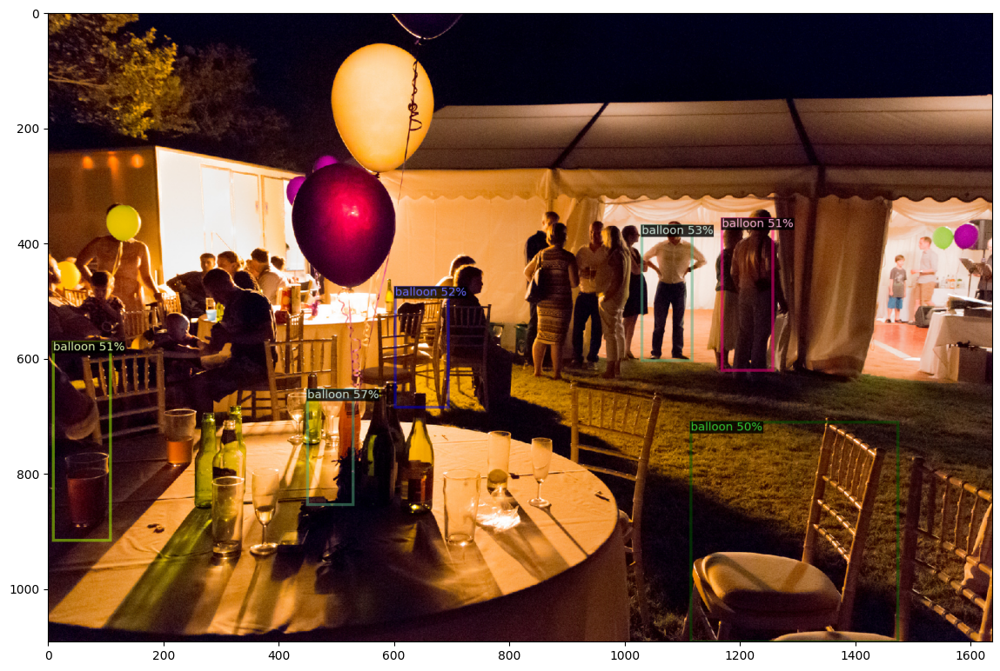

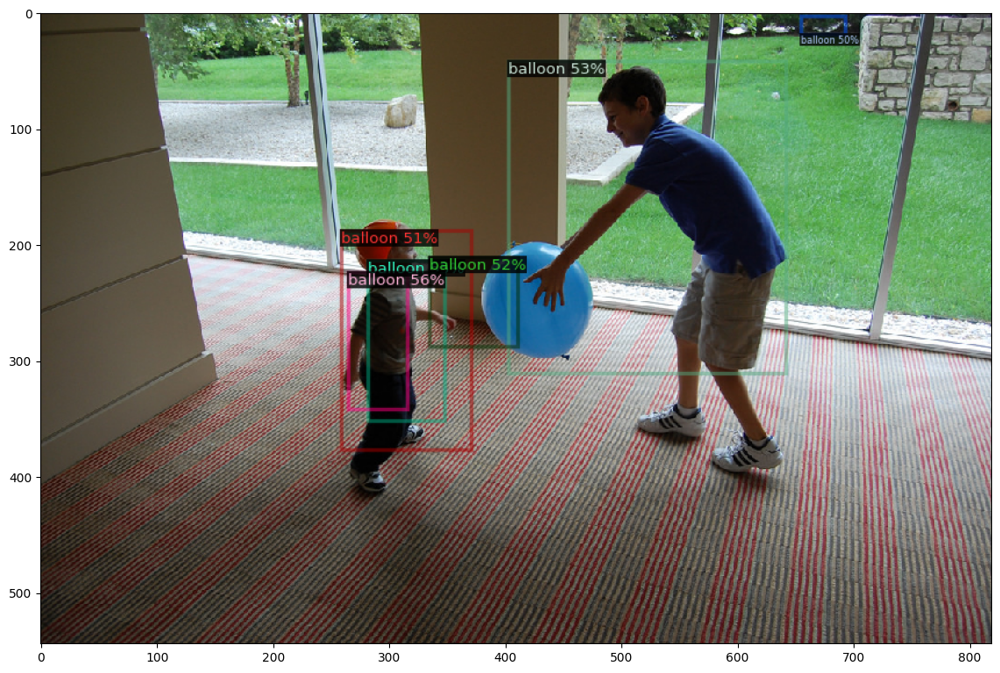

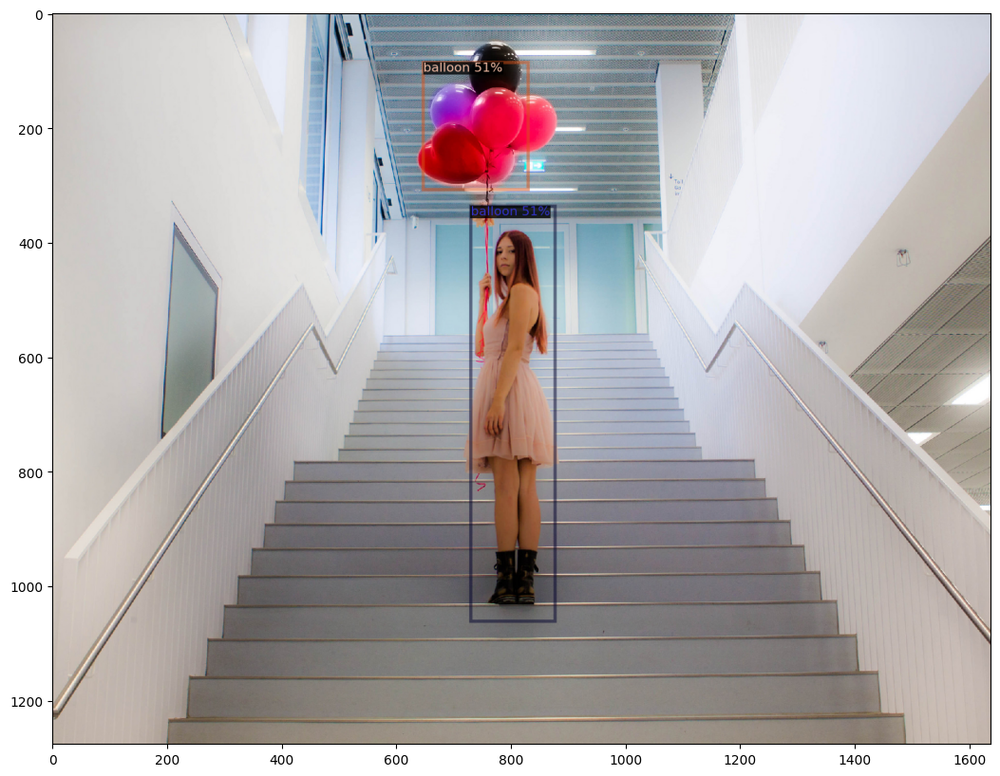

In [22]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = DatasetCatalog.get('balloon_val')
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [28]:
import copy
from detectron2.data import build_detection_test_loader
from d2go.export.exporter import convert_and_export_predictor

import logging

# disable all the warnings
previous_level = logging.root.manager.disable
logging.disable(logging.INFO)

pytorch_model = runner.build_model(cfg, eval_only=True)
pytorch_model.cpu()

datasets = cfg.DATASETS.TRAIN[0]
data_loader = runner.build_detection_test_loader(cfg, datasets)

predictor_path = convert_and_export_predictor(
  copy.deepcopy(cfg),
  copy.deepcopy(pytorch_model),
  "torchscript_int8@tracing",
  './',
  data_loader
)

# recover the logging level
logging.disable(previous_level)

C:\Users\patha\anaconda3\envs\d2go\lib\site-packages\torch\ao\quantization\observer.py:214: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warnings.warn(
c:\users\patha\projects\d2go\detectron2_repo\detectron2\structures\image_list.py:85: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert t.shape[:-2] == tensors[0].shape[:-2], t.shape
c:\users\patha\projects\d2go\detectron2_repo\detectron2\structures\boxes.py:151: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not

c:\users\patha\projects\d2go\d2go_repo\d2go\modeling\backbone\fbnet_v2.py:376: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if len(x.shape) == 4 and (x.shape[2] > 1 or x.shape[3] > 1):
c:\users\patha\projects\d2go\detectron2_repo\detectron2\modeling\roi_heads\fast_rcnn.py:138: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if not valid_mask.all():
c:\users\patha\projects\d2go\detectron2_repo\detectron2\structures\boxes.py:151: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of 

In [29]:
from mobile_cv.predictor.api import create_predictor
model = create_predictor(predictor_path)

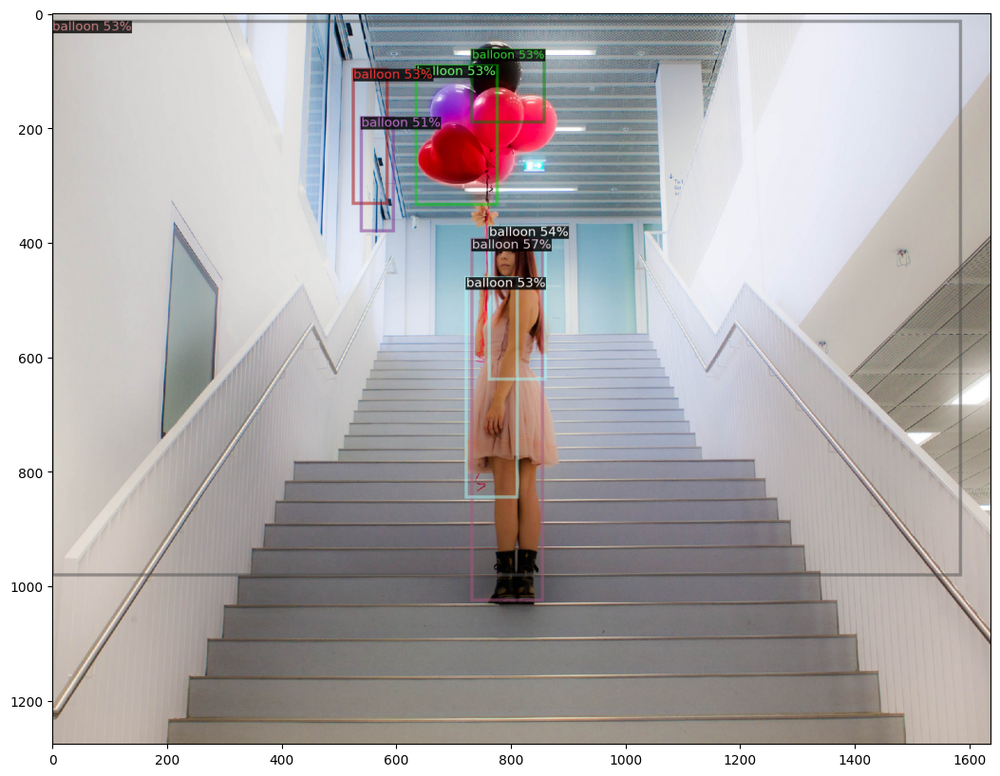

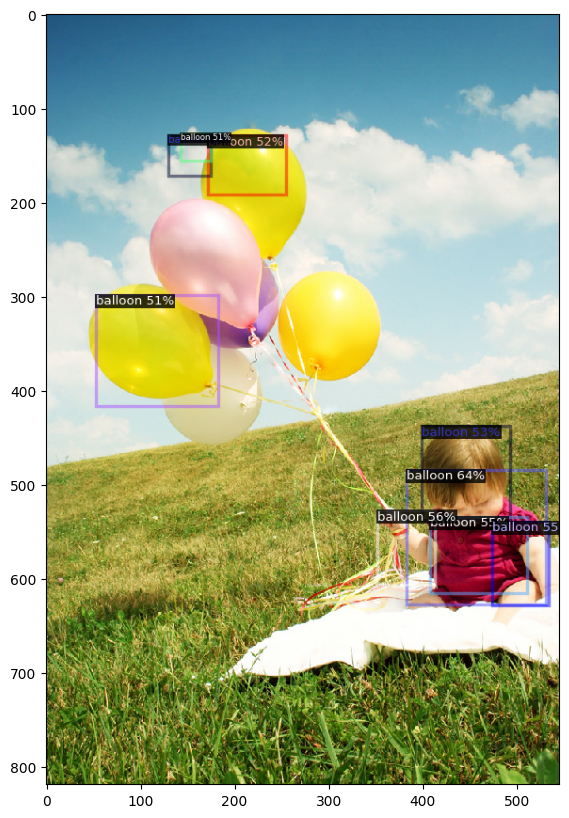

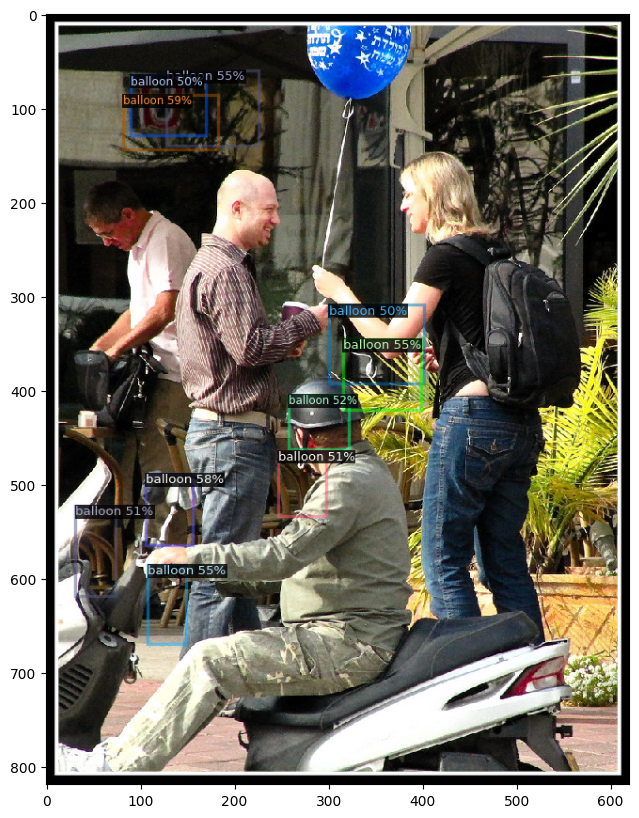

In [30]:
from d2go.utils.demo_predictor import DemoPredictor

predictor = DemoPredictor(model)

dataset_dicts = DatasetCatalog.get('balloon_val')
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [31]:
from typing import List, Dict
import torch

class Wrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
        coco_idx_list = [1]

        self.coco_idx = torch.tensor(coco_idx_list)

    def forward(self, inputs: List[torch.Tensor]):
        x = inputs[0].unsqueeze(0) * 255
        scale = 320.0 / min(x.shape[-2], x.shape[-1])
        x = torch.nn.functional.interpolate(x, scale_factor=scale, mode="bilinear", align_corners=True, recompute_scale_factor=True)
        out = self.model(x[0])
        res : Dict[str, torch.Tensor] = {}
        res["boxes"] = out[0] / scale
        res["labels"] = torch.index_select(self.coco_idx, 0, out[1])
        res["scores"] = out[2]
        return inputs, [res]

In [32]:
orig_model = torch.jit.load(os.path.join(predictor_path, "model.jit"))
wrapped_model = Wrapper(orig_model)

In [33]:
scripted_model = torch.jit.script(wrapped_model)
scripted_model.save("d2go.pt")